In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

from mpl_toolkits import mplot3d

import plotly
import plotly.graph_objs as go
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
data = pd.read_csv('kahuna.csv')
data.head()

,Entity,Year,Deaths %,CO2 Emissions,CO2 Emissions Per Cap,Food Emissions,Total GHG,Consumption of Ozone,Shared CO2 Emissions,Transport,...,Death_under5,Death_5-14,Death_50-69,Death_70+,Death_15-49,Urban%,Child Mortality,Population,GDP,Forest area
0,Albania,1991,17.613636,4228256,1.2889,4011691.0,9030000.0,0.0,0.02,500000.0,...,172.433312,5.975427,271.661092,512.126572,60.714220,36.700,3.93,119.225912,3496.580246,786850.0
1,Albania,1995,16.789055,2066496,0.6638,4861321.1,7480000.0,43.4,0.01,600000.0,...,127.035936,4.580403,240.740486,469.406670,49.692924,38.911,3.39,116.342482,4471.871070,779050.0
2,Albania,1996,16.588451,1993216,0.6432,4569702.9,7280000.0,43.2,0.01,600000.0,...,113.537473,4.373679,255.560407,491.357876,52.069689,39.473,3.26,115.621642,4909.228105,777100.0
3,Albania,1997,15.081361,1531552,0.4941,4431656.7,6510000.0,45.2,0.01,500000.0,...,105.434149,4.414006,269.448518,521.197486,57.988035,40.035,3.13,114.900766,4400.577827,775150.0
4,Albania,1998,15.965796,1744064,0.5607,4344061.6,6810000.0,49.6,0.01,700000.0,...,99.530736,4.493629,280.472022,547.315668,64.973478,40.601,2.99,114.179927,4819.387534,773200.0


------------------

In [3]:
X = data.drop(columns=['Entity', 'Year'])
sc = StandardScaler()
X_sc = sc.fit_transform(X)

In [4]:
km = KMeans(n_clusters=10, random_state=42)
km.fit(X_sc)

KMeans(n_clusters=10, random_state=42)

In [5]:
km.cluster_centers_

array([[-1.41128168e+00, -2.89081803e-02,  6.10234940e-01,
        -1.63080005e-01, -9.20073333e-02,  1.30436619e-02,
        -3.11092949e-02,  1.55109503e-02, -4.08647201e-01,
        -8.14644957e-01, -8.14323974e-01, -1.51564482e-01,
        -1.83598364e-01, -2.31766268e-01, -2.36728756e-01,
        -2.30898967e-01, -1.96661041e-01, -1.44008404e-01,
        -2.19919365e-01,  1.06818719e+00, -8.06344618e-01,
        -5.56487049e-02,  1.01700334e+00, -1.95057787e-02],
       [ 1.47431896e+00,  1.10516103e+00, -5.87624454e-01,
         2.33790674e+00,  1.55080473e+00,  5.10685809e-01,
         1.10069751e+00,  4.54029329e-01,  3.50291723e+00,
         1.25421232e+00,  3.76497764e-01,  4.64740507e+00,
         4.12783488e+00,  6.73489468e+00,  8.86774826e+00,
         8.99731662e+00,  4.80124859e+00,  2.75353146e+00,
         5.14585305e+00, -1.38909494e+00,  9.67954763e-01,
         2.91471668e-01, -7.12574234e-01,  3.02378731e-01],
       [-1.46613885e+00,  6.63011457e+00,  2.03004474e

In [11]:
pd.set_option("display.max_columns", None)
data['cluster'] = km.labels_
data.head()

,Entity,Year,Deaths %,CO2 Emissions,CO2 Emissions Per Cap,Food Emissions,Total GHG,Consumption of Ozone,Shared CO2 Emissions,Transport,Death_rate_ambient_ozone_pol,Death_rate_household_air_pol,Death_rate_all_causes,Death_actual_ozone,Death_actual_particulate,Death_actual_household,Death_under5,Death_5-14,Death_50-69,Death_70+,Death_15-49,Urban%,Child Mortality,Population,GDP,Forest area,cluster
0,Albania,1991,17.614,4228256,1.289,4011691.000,9030000.000,0.000,0.020,500000.000,4.361,98.112,46.052,73.711,949.199,2033.148,172.433,5.975,271.661,512.127,60.714,36.700,3.930,119.226,3496.580,786850.000,3
1,Albania,1995,16.789,2066496,0.664,4861321.100,7480000.000,43.400,0.010,600000.000,3.420,81.760,37.768,63.413,828.043,1792.208,127.036,4.580,240.740,469.407,49.693,38.911,3.390,116.342,4471.871,779050.000,8
2,Albania,1996,16.588,1993216,0.643,4569702.900,7280000.000,43.200,0.010,600000.000,3.079,80.923,38.586,58.833,858.067,1795.574,113.537,4.374,255.560,491.358,52.070,39.473,3.260,115.622,4909.228,777100.000,8
3,Albania,1997,15.081,1531552,0.494,4431656.700,6510000.000,45.200,0.010,500000.000,3.024,76.985,39.244,59.782,898.700,1757.485,105.434,4.414,269.449,521.197,57.988,40.035,3.130,114.901,4400.578,775150.000,8
4,Albania,1998,15.966,1744064,0.561,4344061.600,6810000.000,49.600,0.010,700000.000,2.600,72.162,40.057,53.195,943.590,1691.903,99.531,4.494,280.472,547.316,64.973,40.601,2.990,114.180,4819.388,773200.000,8


In [13]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
data.drop(columns=['Year', 'Food Emissions', 'Shared CO2 Emissions', 'Transport', 'Death_rate_ambient_ozone_pol', 'Death_rate_household_air_pol']).groupby('cluster').mean().T

cluster,0,1,2,3,4,5,6,7,8,9
Deaths %,4.170,17.749,3.912,14.659,15.130,23.310,8.222,19.959,10.786,6.427
CO2 Emissions,195241420.661,1126670762.917,5664404257.417,14819845.437,122462387.405,3306942444.071,777653427.379,7782466472.600,74610255.439,49664902.333
CO2 Emissions Per Cap,9.677,1.012,19.947,0.450,25.547,2.629,4.960,5.716,3.655,12.252
Total GHG,240651608.040,1818057500.000,6159869583.333,123525276.292,127859008.264,3935701428.571,2011754545.455,8920881000.000,121875561.268,50811250.000
Consumption of Ozone,2500.243,8908.782,47467.957,278.116,709.537,89397.579,7801.784,23945.755,861.627,706.672
Death_rate_all_causes,23.568,70.346,20.981,37.330,143.904,86.259,47.961,94.508,66.660,33.335
Death_actual_ozone,299.982,73205.084,12606.913,815.707,59.526,126073.693,1917.455,140804.233,279.097,18.785
Death_actual_particulate,5617.995,441390.990,80760.443,8503.822,2883.107,697339.682,76479.718,1113472.337,10610.047,973.760
Death_actual_household,543.168,939771.430,277.337,41002.334,221.179,1104015.779,45433.404,665853.802,4850.244,19.965
Death_under5,95.531,92592.990,964.144,3153.896,155.983,39851.878,3151.675,14363.293,893.407,6.032


In [14]:
centroids = pd.DataFrame(
    sc.inverse_transform(km.cluster_centers_),
    columns=data.columns.drop(['Entity', 'cluster', 'Year'])
)
centroids

,Deaths %,CO2 Emissions,CO2 Emissions Per Cap,Food Emissions,Total GHG,Consumption of Ozone,Shared CO2 Emissions,Transport,Death_rate_ambient_ozone_pol,Death_rate_household_air_pol,Death_rate_all_causes,Death_actual_ozone,Death_actual_particulate,Death_actual_household,Death_under5,Death_5-14,Death_50-69,Death_70+,Death_15-49,Urban%,Child Mortality,Population,GDP,Forest area
0,4.170,195241420.661,9.677,87824840.544,240651608.040,2500.243,0.697,43013316.583,1.021,2.208,23.568,299.982,5617.995,543.168,95.531,2.162,1607.567,3852.186,360.531,80.378,0.944,145.757,34391.225,33520151.314
1,17.749,1126670762.917,1.012,926724466.958,1818057500.000,8908.782,3.962,117554166.667,16.031,157.193,70.346,73205.084,441390.990,939771.430,92592.990,2652.345,172598.324,201137.193,45615.222,28.406,8.698,363.856,2950.100,67495141.667
2,3.912,5664404257.417,19.947,1411458905.708,6159869583.333,47467.957,20.979,1637741666.667,3.014,0.073,20.981,12606.913,80760.443,277.337,964.144,7.433,26056.717,61425.546,4913.515,78.875,0.858,31.124,49302.893,305191875.000
3,14.659,14819845.437,0.450,106187082.313,123525276.292,278.116,0.053,3917112.299,3.987,179.933,37.330,815.707,8503.822,41002.334,3153.896,62.414,2372.477,2978.648,752.094,33.332,10.729,115.047,2787.204,21650299.506
4,15.130,122462387.405,25.547,16466601.736,127859008.264,709.537,0.425,22690909.091,4.574,5.045,143.904,59.526,2883.107,221.179,155.983,4.741,1247.635,930.650,603.624,86.306,1.380,270.189,60407.689,254101.041
5,23.310,3306942444.071,2.629,1727855948.643,3935701428.571,89397.579,13.590,170250000.000,18.254,141.706,86.259,126073.693,697339.682,1104015.779,39851.878,1206.510,237837.645,487979.095,56538.247,32.625,4.341,129.384,2744.616,170210272.714
6,8.222,777653427.379,4.960,1255515117.653,2011754545.455,7801.784,2.800,147246969.697,1.317,36.148,47.961,1917.455,76479.718,45433.404,3151.675,67.496,29772.448,36843.078,8562.476,67.762,3.270,43.710,13149.499,517324069.394
7,19.959,7782466472.600,5.716,2233727814.300,8920881000.000,23945.755,23.945,531400000.000,13.797,58.714,94.508,140804.233,1113472.337,665853.802,14363.293,417.878,347252.239,811333.143,80910.017,47.167,1.843,140.848,7852.768,196814380.100
8,10.786,74610255.439,3.655,52454176.849,121875561.268,861.627,0.273,13304884.319,1.787,35.263,66.660,279.097,10610.047,4850.244,893.407,33.527,3783.935,5049.050,1129.225,58.009,3.142,101.897,10351.416,10927883.112
9,6.427,49664902.333,12.252,4441638.292,50811250.000,706.672,0.183,5641666.667,0.716,0.852,33.335,18.785,973.760,19.965,6.032,0.669,352.504,549.986,83.354,100.000,0.406,6067.273,59674.719,16706.379


In [21]:
scores = []
for k in range(2, 16):
    cl = KMeans(n_clusters=k)
    cl.fit(X_sc)
    inertia = cl.inertia_
    sil = silhouette_score(X_sc, cl.labels_)
    scores.append([k, inertia, sil])
    
score = pd.DataFrame(scores)
score.columns = ['k', 'inertia', 'silhouette']
score

,k,inertia,silhouette
0,2,38563.314,0.798
1,3,32001.744,0.761
2,4,25712.987,0.277
3,5,22522.346,0.279
4,6,19782.869,0.290
5,7,16959.916,0.317
6,8,14980.351,0.293
7,9,12962.793,0.310
8,10,11716.471,0.325
9,11,10624.880,0.324


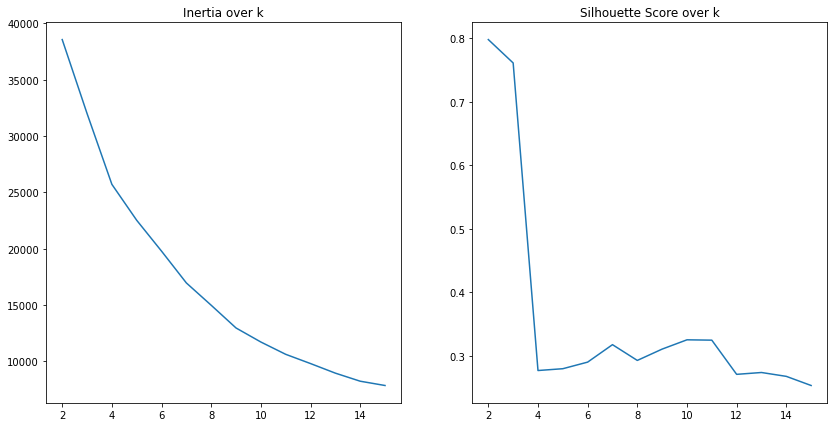

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].plot(score.k, score.inertia)
axes[0].set_title('Inertia over k')
axes[1].plot(score.k, score.silhouette);
axes[1].set_title('Silhouette Score over k');

In [23]:
columns=data.columns.drop(['Entity', 'cluster', 'Year'])
rev_columns = list(columns.astype(str))
rev_columns.reverse()

In [28]:
data.cluster.unique()

array([3, 8, 0, 4, 6, 5, 7, 1, 9, 2], dtype=int32)

/Users/kevingates/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


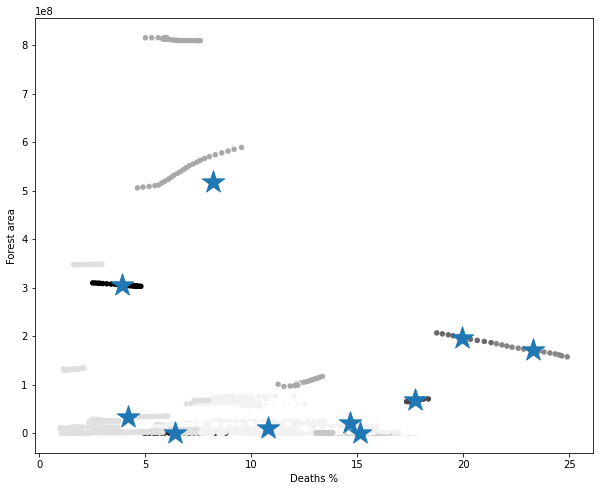

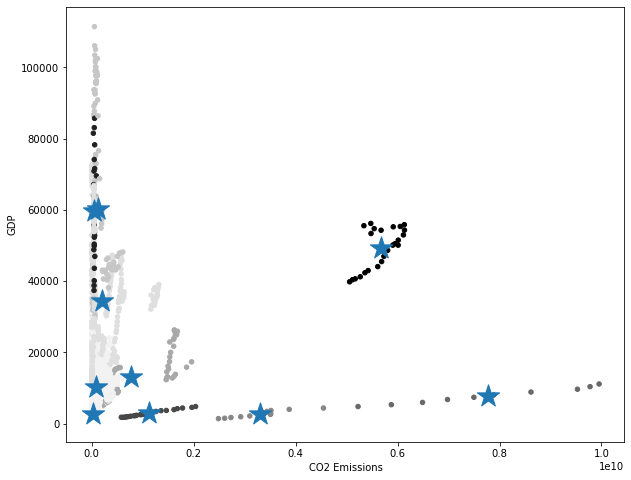

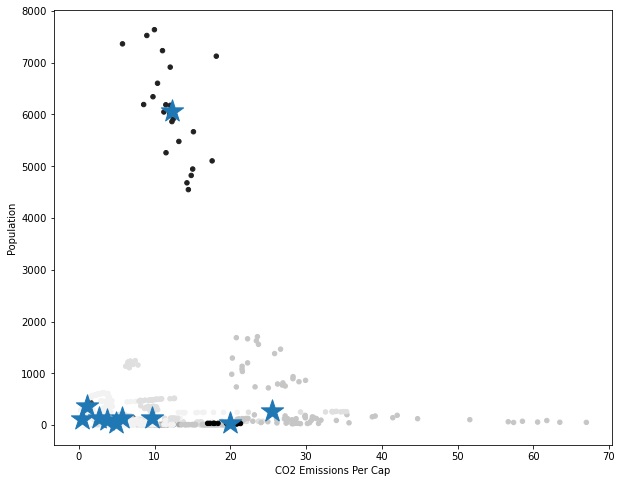

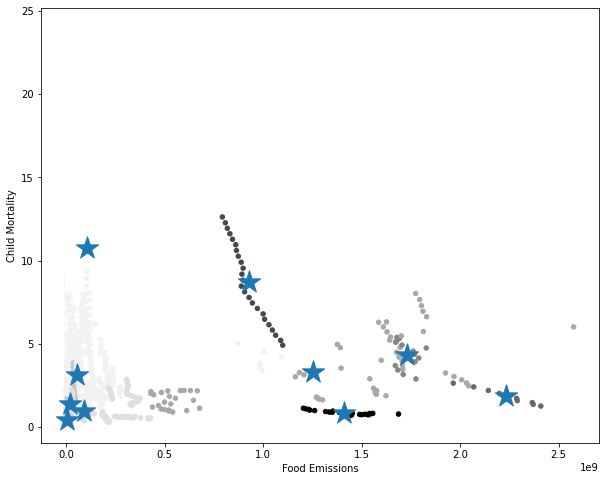

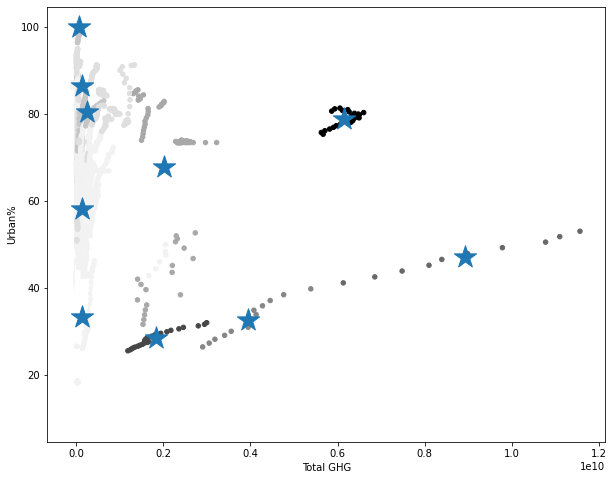

...

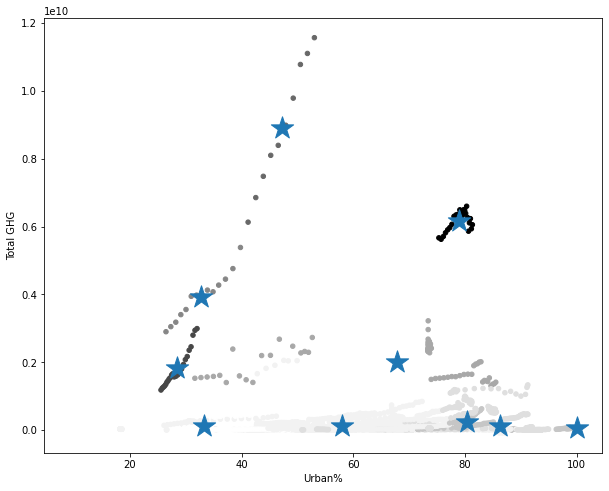

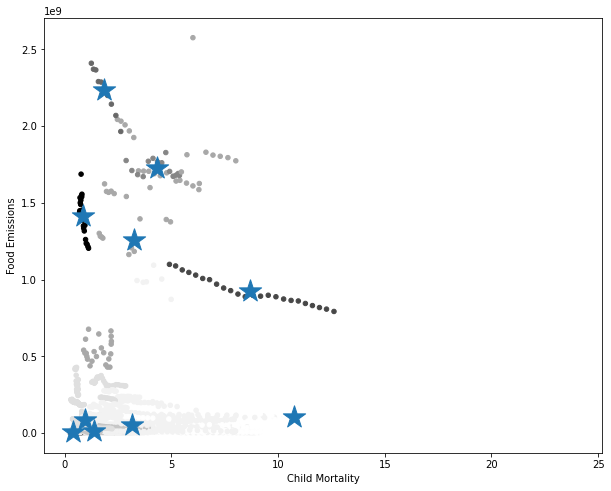

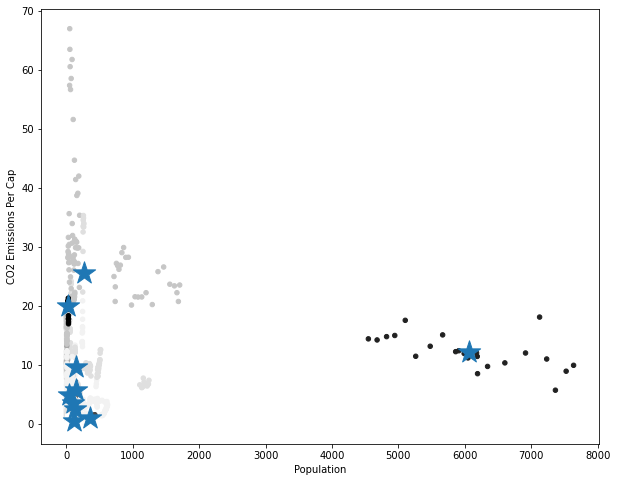

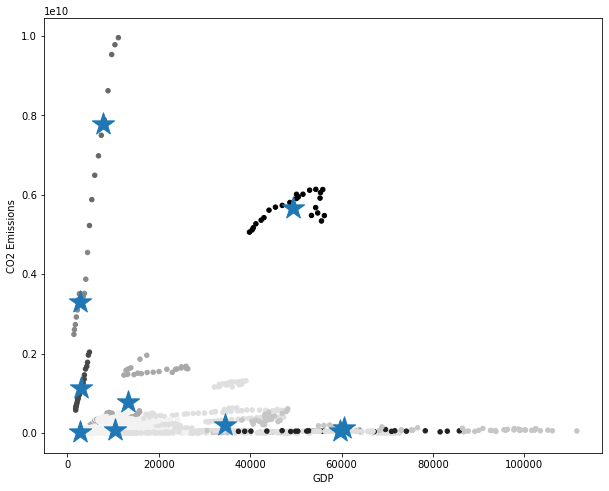

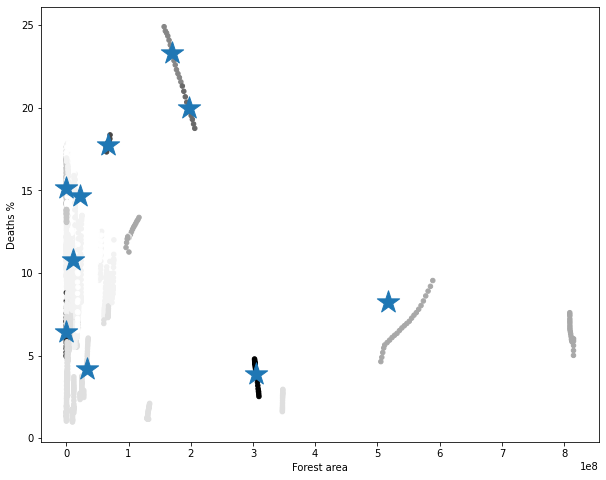

In [32]:
for x, y in zip(columns, rev_columns):
    colors = np.linspace(0, 1, len(data.cluster.unique()))
    colordict = dict(zip(data.cluster.unique(), colors))  
    data["color"] = data['cluster'].apply(lambda x: colordict[x])
    #colors = ["grey", "red", "orange", "yellow", "green", "blue", "purple", "pink", "black", "tan"]
    #data['color'] = data['cluster'].map(lambda p: colors[p])

    ax = data.plot(    
        kind="scatter", 
        x=x, y=y,
        figsize=(10,8),
        c = data['color']
    )
    centroids.plot(
    kind="scatter", 
    x=x, y=y, 
    marker="*", #c=["maroon", "darkgreen", "navy"], 
    s=550,
    ax=ax
    );

----------------------

In [33]:
#making a snapshot of the data
snap = data[['Year','Entity','CO2 Emissions','CO2 Emissions Per Cap','Total GHG','Consumption of Ozone','Urban%','Population','GDP','Forest area','Deaths %','Child Mortality','Death_rate_all_causes','Death_under5','Death_5-14','Death_70+','cluster']]
snap.head()

,Year,Entity,CO2 Emissions,CO2 Emissions Per Cap,Total GHG,Consumption of Ozone,Urban%,Population,GDP,Forest area,Deaths %,Child Mortality,Death_rate_all_causes,Death_under5,Death_5-14,Death_70+,cluster
0,1991,Albania,4228256,1.289,9030000.000,0.000,36.700,119.226,3496.580,786850.000,17.614,3.930,46.052,172.433,5.975,512.127,3
1,1995,Albania,2066496,0.664,7480000.000,43.400,38.911,116.342,4471.871,779050.000,16.789,3.390,37.768,127.036,4.580,469.407,8
2,1996,Albania,1993216,0.643,7280000.000,43.200,39.473,115.622,4909.228,777100.000,16.588,3.260,38.586,113.537,4.374,491.358,8
3,1997,Albania,1531552,0.494,6510000.000,45.200,40.035,114.901,4400.578,775150.000,15.081,3.130,39.244,105.434,4.414,521.197,8
4,1998,Albania,1744064,0.561,6810000.000,49.600,40.601,114.180,4819.388,773200.000,15.966,2.990,40.057,99.531,4.494,547.316,8


In [34]:
#adding a country's commitment to a net zero future

In [35]:
net_zero_binary = pd.read_csv('../../data/dirty_data/net-zero-target-set.csv')
net_zero_binary.head()

,Entity,Code,Year,Is there a net-zero target?
0,Antigua and Barbuda,ATG,2040,Yes
1,Australia,AUS,2050,Yes
2,Austria,AUT,2040,Yes
3,Bahrain,BHR,2060,Yes
4,Barbados,BRB,2030,Yes


In [36]:
len(net_zero_binary.Entity.unique())

66

In [37]:
nz_list = net_zero_binary.Entity.unique()

In [38]:
nz=[]
nz_bin=[]
for country in snap.Entity:
    if country in nz_list:
        nz.append('Yes')
        nz_bin.append(1)
    else:
        nz.append('No')
        nz_bin.append(0)


In [39]:
len(nz), len(nz_bin)

(2409, 2409)

In [40]:
snap.shape

(2409, 17)

In [41]:
snap['net_zero'] = nz

/var/folders/t7/10pc37nd7nd77w12vtbk6_5m0000gn/T/ipykernel_25237/1497714533.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snap['net_zero'] = nz


In [42]:
snap['net_zero_bin'] = nz_bin

/var/folders/t7/10pc37nd7nd77w12vtbk6_5m0000gn/T/ipykernel_25237/952615607.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snap['net_zero_bin'] = nz_bin


In [43]:
snap.head()

,Year,Entity,CO2 Emissions,CO2 Emissions Per Cap,Total GHG,Consumption of Ozone,Urban%,Population,GDP,Forest area,Deaths %,Child Mortality,Death_rate_all_causes,Death_under5,Death_5-14,Death_70+,cluster,net_zero,net_zero_bin
0,1991,Albania,4228256,1.289,9030000.000,0.000,36.700,119.226,3496.580,786850.000,17.614,3.930,46.052,172.433,5.975,512.127,3,No,0
1,1995,Albania,2066496,0.664,7480000.000,43.400,38.911,116.342,4471.871,779050.000,16.789,3.390,37.768,127.036,4.580,469.407,8,No,0
2,1996,Albania,1993216,0.643,7280000.000,43.200,39.473,115.622,4909.228,777100.000,16.588,3.260,38.586,113.537,4.374,491.358,8,No,0
3,1997,Albania,1531552,0.494,6510000.000,45.200,40.035,114.901,4400.578,775150.000,15.081,3.130,39.244,105.434,4.414,521.197,8,No,0
4,1998,Albania,1744064,0.561,6810000.000,49.600,40.601,114.180,4819.388,773200.000,15.966,2.990,40.057,99.531,4.494,547.316,8,No,0


In [44]:
snap.net_zero.value_counts()

No     1532
Yes     877
Name: net_zero, dtype: int64

In [45]:
snap.net_zero_bin.value_counts()

0    1532
1     877
Name: net_zero_bin, dtype: int64

In [46]:
# settings to display all columns
pd.set_option("display.max_columns", None)

In [47]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns=['Year']).groupby(['Entity', 'cluster']).mean()

CO2 Emissions  CO2 Emissions Per Cap     Total GHG  \
Entity     cluster                                                       
Albania    3          4228256.000                  1.289   9030000.000   
           8          3583777.684                  1.181   8654210.526   
Algeria    8        101880830.957                  3.117 140026956.522   
Angola     3         18204597.421                  0.896 175978947.368   
           8         33296311.000                  1.236 183480000.000   
...                           ...                    ...           ...   
Uzbekistan 8        115503679.667                  4.506 215160952.381   
Vietnam    3         42940014.900                  0.550  73401000.000   
           8        120403047.500                  1.378 210881666.667   
Zambia     3          2579400.400                  0.230 455966000.000   
Zimbabwe   3         11924064.739                  1.000  67426521.739   

                    Consumption of Ozone  Urban%  Population      GDP  \
Entity     cluster                                                      
Albania    3                       0.000  36.700     119.226 3496.580   
           8                      29.939  46.196     110.393 7804.202   
Algeria    8                    1124.284  62.128      13.659 9622.430   
Angola     3                      63.636  53.464      15.281 6141.851   
           8                      13.210  62.731      21.610 8239.831   
...                                  ...     ...         ...      ...   
Uzbekistan 8                      88.336  47.454      60.581 3466.677   
Vietnam    3                     534.690  23.211     240.224 2592.289   
           8                     326.064  29.511     279.958 4755.146   
Zambia     3                      28.745  37.692      15.077 2415.007   
Zimbabwe   3                     423.191  32.996      31.246 3132.164   

                    Forest area  Deaths %  Child Mortality  \
Entity     cluster                                           
Albania    3         786850.000    17.614            3.930   
           8         777001.895    13.752            2.162   
Algeria    8        1736482.609    11.005            3.572   
Angola     3       75238296.000    12.290           16.919   
           8       69937752.000    10.701            9.300   
...                         ...       ...              ...   
Uzbekistan 8        3075036.581    15.526            5.182   
Vietnam    3       11109776.800    16.658            3.499   
           8       13126102.667    14.716            2.362   
Zambia     3       46921448.000    10.058           12.937   
Zimbabwe   3       18229773.043     8.284            8.852   

                    Death_rate_all_causes  Death_under5  Death_5-14  \
Entity     cluster                                                    
Albania    3                       46.052       172.433       5.975   
           8                       40.723        57.648       3.005   
Algeria    8                       95.676      1413.454      41.018   
Angola     3                       25.090      1218.769      28.537   
           8                       36.264      1574.991      48.110   
...                                   ...           ...         ...   
Uzbekistan 8                      162.361      2476.389     143.125   
Vietnam    3                       30.706      1234.066      17.017   
           8                       46.778      1131.511      16.569   
Zambia     3                       26.387       730.975      18.630   
Zimbabwe   3                       33.444       653.615       9.241   

                    Death_70+  net_zero_bin  
Entity     cluster                           
Albania    3          512.127         0.000  
           8          719.568         0.000  
Algeria    8         7554.208         0.000  
Angola     3          476.815         0.000  
           8          976.022         0.000  
...                       ...           ...  
Uzbekist

In [48]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns=['Year']).groupby(['Entity', 'cluster']).mean().T

Entity                    Albania                   Algeria        Angola  \
cluster                         3           8             8             3   
CO2 Emissions         4228256.000 3583777.684 101880830.957  18204597.421   
CO2 Emissions Per Cap       1.289       1.181         3.117         0.896   
Total GHG             9030000.000 8654210.526 140026956.522 175978947.368   
Consumption of Ozone        0.000      29.939      1124.284        63.636   
Urban%                     36.700      46.196        62.128        53.464   
Population                119.226     110.393        13.659        15.281   
GDP                      3496.580    7804.202      9622.430      6141.851   
Forest area            786850.000  777001.895   1736482.609  75238296.000   
Deaths %                   17.614      13.752        11.005        12.290   
Child Mortality             3.930       2.162         3.572        16.919   
Death_rate_all_causes      46.052      40.723        95.676        25.090   
Death_under5              172.433      57.648      1413.454      1218.769   
Death_5-14                  5.975       3.005        41.018        28.537   
Death_70+                 512.127     719.568      7554.208       476.815   
net_zero_bin                0.000       0.000         0.000         0.000   

Entity                                  Argentina     Armenia     Australia  \
cluster                           8             0           8             0   
CO2 Emissions          33296311.000 150264818.500 4145867.550 356715511.720   
CO2 Emissions Per Cap         1.236         3.984       1.393        17.980   
Total GHG             183480000.000 400927500.000 7356500.000 581838000.000   
Consumption of Ozone         13.210      3605.673      84.458      1593.277   
Urban%                       62.731        89.330      64.198        84.878   
Population                   21.610        13.683     105.383         2.586   
GDP                        8239.831     19379.664    6959.846     39116.972   
Forest area            69937752.000  32620025.000  331704.750 131691114.000   
Deaths %                     10.701         4.838      12.996         1.554   
Child Mortality               9.300         1.962       2.543         0.611   
Death_rate_all_causes        36.264        29.528      91.818         7.573   
Death_under5               1574.991       346.063      72.981        33.022   
Death_5-14                   48.110         6.034       1.959         0.115   
Death_70+                   976.022      6720.933    1742.961      1396.696   
net_zero_bin                  0.000         0.000       0.000         1.000   

Entity                     Austria   Azerbaijan      Bahrain    Bangladesh  \
cluster                          0            8            4             3   
CO2 Emissions         61961985.800 32052830.944 19635394.750  33340031.375   
CO2 Emissions Per Cap        7.912        3.755       24.395         0.247   
Total GHG             64146000.000 63031666.667 26818750.000 144742916.667   
Consumption of Ozone      1450.660       92.351      136.780       354.299   
Urban%                      62.416       52.439       88.452        25.286   
Population                  94.733      102.398     1112.435       997.465   
GDP                      38497.278     8333.410    46341.843      2173.386   
Forest area            3788164.000  1009265.828      392.750   1908753.037   
Deaths %                     6.247       12.295       16.496        20.501   
Child Mortality              0.852        5.747        1.354         8.458   
Death_rate_all_causes       41.309      100.716      165.442        43.212   
Death_under5                24.118      583.262       10.287      8491.625   
Death_5-14                   0.295       31.048        0.322       341.972   
Death_70+                 3704.282     2604.554      151.165     13543.224   
net_zero_bin                 1.000        0.000        1.000         0.000   

Entity             

In [50]:
#some countries have their data split into multiple clusters

In [51]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns=['Year']).groupby(['cluster', 'Entity']).mean()

CO2 Emissions  CO2 Emissions Per Cap     Total GHG  \
cluster Entity                                                             
0       Argentina     150264818.500                  3.984 400927500.000   
        Australia     356715511.720                 17.980 581838000.000   
        Austria        61961985.800                  7.912  64146000.000   
        Brunei          6019810.500                 17.285  18494166.667   
        Canada        564303652.611                 17.394 853872222.222   
...                             ...                    ...           ...   
8       Turkmenistan   45329176.565                  9.543  80863043.478   
        Ukraine       341682321.182                  7.069 437410000.000   
        Uzbekistan    115503679.667                  4.506 215160952.381   
        Vietnam       120403047.500                  1.378 210881666.667   
9       Singapore      49664902.333                 12.252  50811250.000   

                      Consumption of Ozone  Urban%  Population       GDP  \
cluster Entity                                                             
0       Argentina                 3605.673  89.330      13.683 19379.664   
        Australia                 1593.277  84.878       2.586 39116.972   
        Austria                   1450.660  62.416      94.733 38497.278   
        Brunei                      37.565  71.895      65.403 69779.702   
        Canada                     548.740  80.166       3.627 41617.256   
...                                    ...     ...         ...       ...   
8       Turkmenistan                30.370  46.800       9.950  6371.845   
        Ukraine                    783.940  67.640      83.631 10021.091   
        Uzbekistan                  88.336  47.454      60.581  3466.677   
        Vietnam                    326.064  29.511     279.958  4755.146   
9       Singapore                  706.672 100.000    6067.273 59674.719   

                       Forest area  Deaths %  Child Mortality  \
cluster Entity                                                  
0       Argentina     32620025.000     4.838            1.962   
        Australia    131691114.000     1.554            0.611   
        Austria        3788164.000     6.247            0.852   
        Brunei          393270.833     2.157            1.072   
        Canada       347541517.556     2.336            0.594   
...                            ...       ...              ...   
8       Turkmenistan   4127000.000    10.903            6.019   
        Ukraine        9492009.091     8.769            1.604   
        Uzbekistan     3075036.581    15.526            5.182   
        Vietnam       13126102.667    14.716            2.362   
9       Singapore        16706.379     6.427            0.406   

                      Death_rate_all_causes  Death_under5  Death_5-14  \
cluster Entity                                                          
0       Argentina                    29.528       346.063       6.034   
        Australia                     7.573        33.022       0.115   
        Austria                      41.309        24.118       0.295   
        Brunei                       18.616         0.891       0.029   
        Canada                       10.253        53.335       0.260   
...                                     ...           ...         ...   
8       Turkmenistan                120.264       420.687      14.225   
        Ukraine                      85.848       226.891       6.051   
        Uzbekistan                  162.361      2476.389     143.125   
        Vietnam                      46.778      1131.511      16.569   
9       Singapore                    33.335         6.032       0.669   

                      Death_70+  net_zero_bin  
cluster Entity                                 
0       Argentina      6720.933         0.000  
        Australia      1396.696         1.000  
        Austria        3704.282         1.000  
        

In [52]:
#Creating Visuals

In [53]:
snap.head()

,Year,Entity,CO2 Emissions,CO2 Emissions Per Cap,Total GHG,Consumption of Ozone,Urban%,Population,GDP,Forest area,Deaths %,Child Mortality,Death_rate_all_causes,Death_under5,Death_5-14,Death_70+,cluster,net_zero,net_zero_bin
0,1991,Albania,4228256,1.289,9030000.000,0.000,36.700,119.226,3496.580,786850.000,17.614,3.930,46.052,172.433,5.975,512.127,3,No,0
1,1995,Albania,2066496,0.664,7480000.000,43.400,38.911,116.342,4471.871,779050.000,16.789,3.390,37.768,127.036,4.580,469.407,8,No,0
2,1996,Albania,1993216,0.643,7280000.000,43.200,39.473,115.622,4909.228,777100.000,16.588,3.260,38.586,113.537,4.374,491.358,8,No,0
3,1997,Albania,1531552,0.494,6510000.000,45.200,40.035,114.901,4400.578,775150.000,15.081,3.130,39.244,105.434,4.414,521.197,8,No,0
4,1998,Albania,1744064,0.561,6810000.000,49.600,40.601,114.180,4819.388,773200.000,15.966,2.990,40.057,99.531,4.494,547.316,8,No,0


In [54]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.groupby('cluster').mean().T


cluster,0,1,2,3,4,5,6,7,8,9
Year,2002.641,2001.500,2001.500,2001.704,2003.331,1996.500,2002.197,2008.500,2002.265,2001.500
CO2 Emissions,195241420.661,1126670762.917,5664404257.417,14819845.437,122462387.405,3306942444.071,777653427.379,7782466472.600,74610255.439,49664902.333
CO2 Emissions Per Cap,9.677,1.012,19.947,0.450,25.547,2.629,4.960,5.716,3.655,12.252
Total GHG,240651608.040,1818057500.000,6159869583.333,123525276.292,127859008.264,3935701428.571,2011754545.455,8920881000.000,121875561.268,50811250.000
Consumption of Ozone,2500.243,8908.782,47467.957,278.116,709.537,89397.579,7801.784,23945.755,861.627,706.672
Urban%,80.378,28.406,78.875,33.332,86.306,32.625,67.762,47.167,58.009,100.000
Population,145.757,363.856,31.124,115.047,270.189,129.384,43.710,140.848,101.897,6067.273
GDP,34391.225,2950.100,49302.893,2787.204,60407.689,2744.616,13149.499,7852.768,10351.416,59674.719
Forest area,33520151.314,67495141.667,305191875.000,21650299.506,254101.041,170210272.714,517324069.394,196814380.100,10927883.112,16706.379
Deaths %,4.170,17.749,3.912,14.659,15.130,23.310,8.222,19.959,10.786,6.427


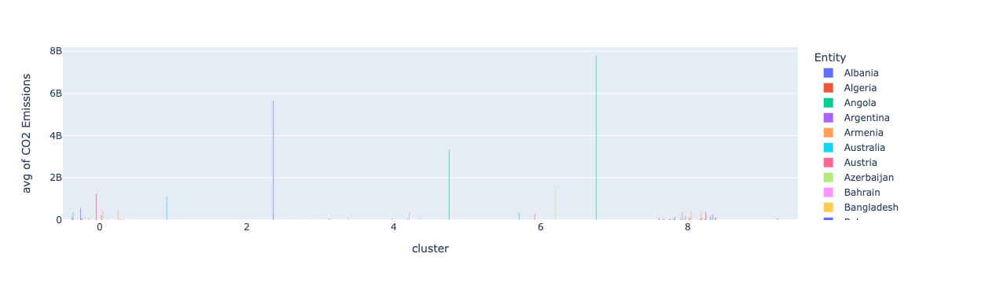

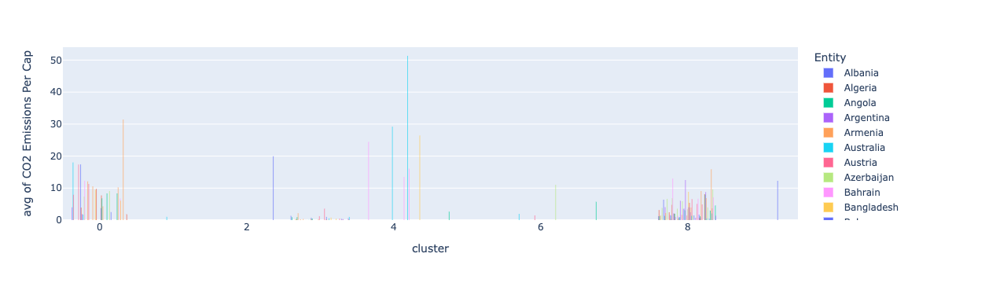

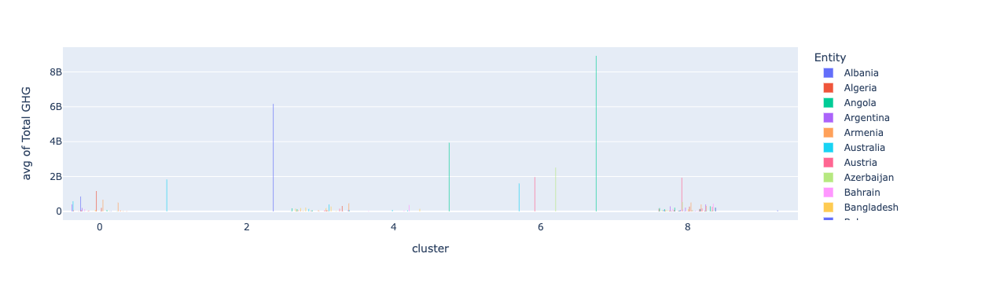

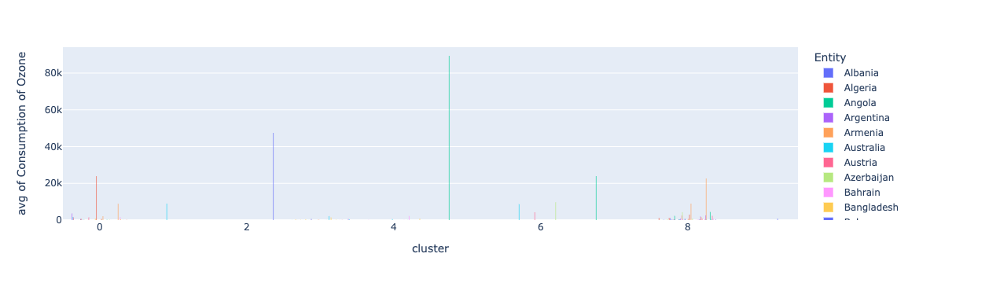

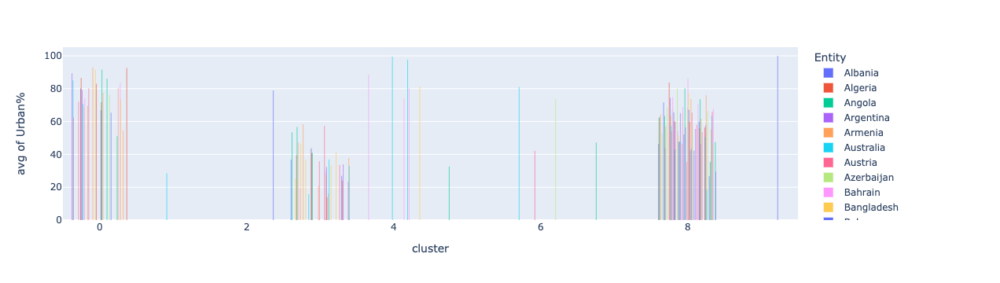

...

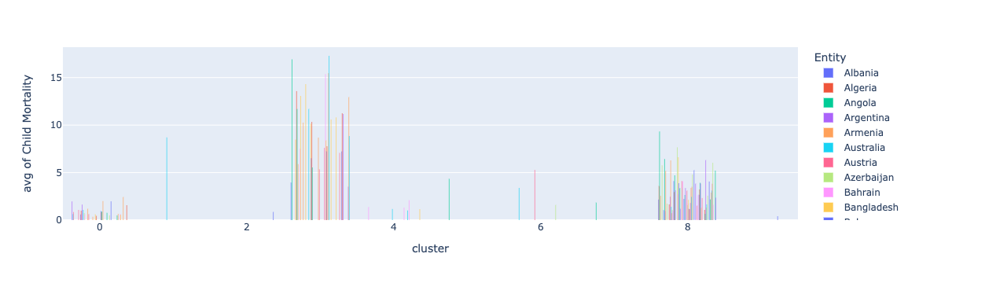

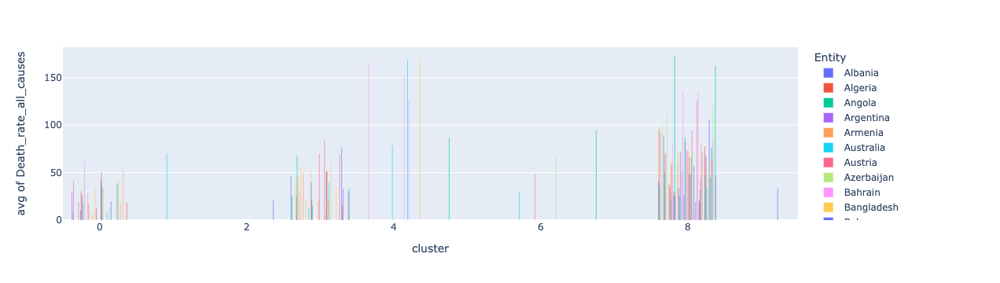

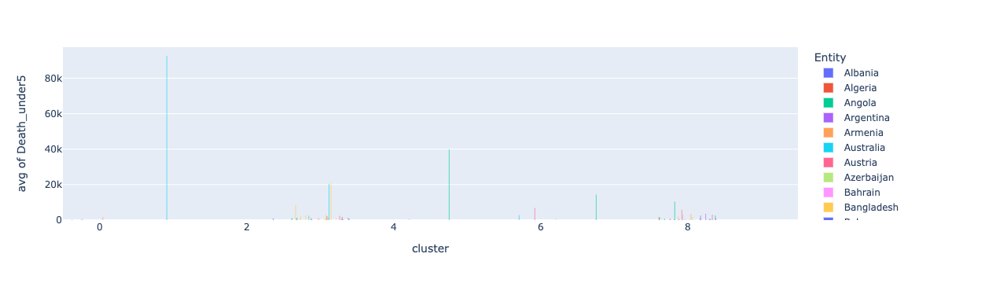

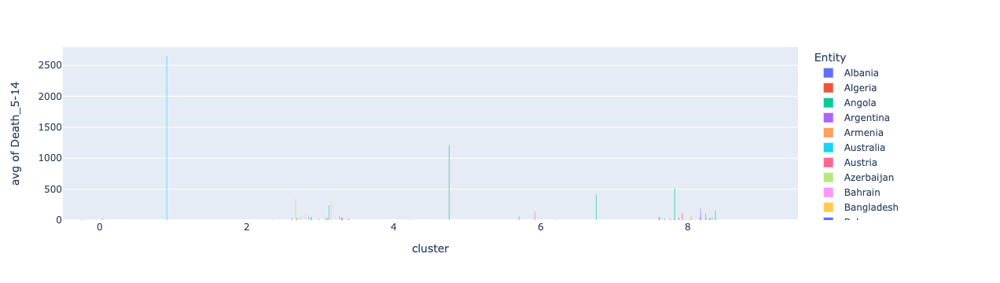

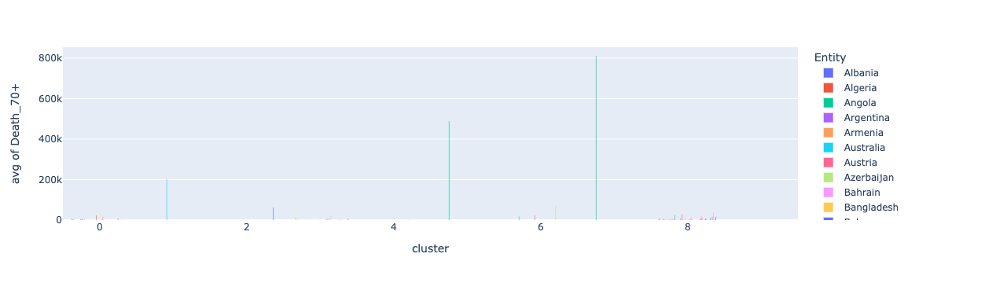

In [55]:
#plot each cluster's mean snap statistics (all) (bar)
stats=['CO2 Emissions','CO2 Emissions Per Cap','Total GHG','Consumption of Ozone','Urban%','Population','GDP','Forest area','Deaths %','Child Mortality','Death_rate_all_causes','Death_under5','Death_5-14','Death_70+']

for stat in stats:
    fig = px.histogram(snap, x='cluster', y=stat, color='Entity', barmode='group', histfunc='avg')
    fig.show()



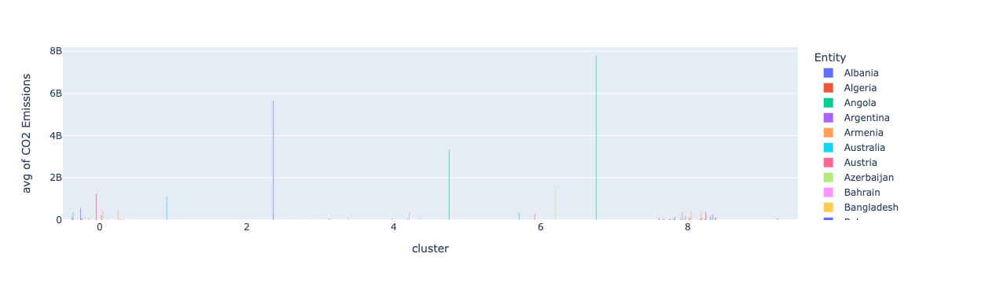

In [56]:
fig = px.histogram(snap, x='cluster', y=snap['CO2 Emissions'], color='Entity', barmode='group', orientation='v', histfunc='avg')
fig.show()

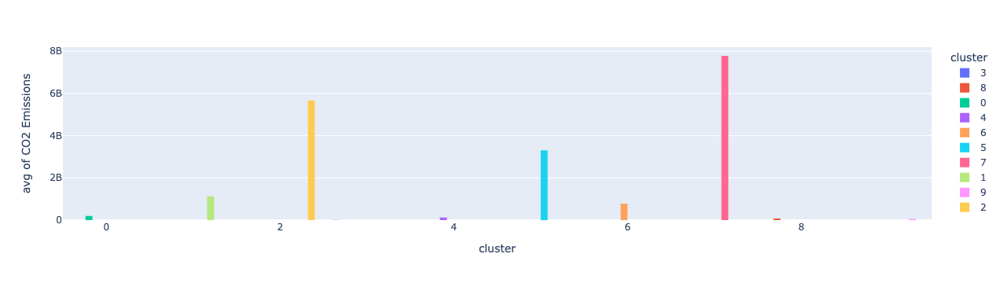

In [57]:
fig = px.histogram(snap, x='cluster', y=snap['CO2 Emissions'], color='cluster', barmode='group', orientation='v', histfunc='avg')
fig.show()

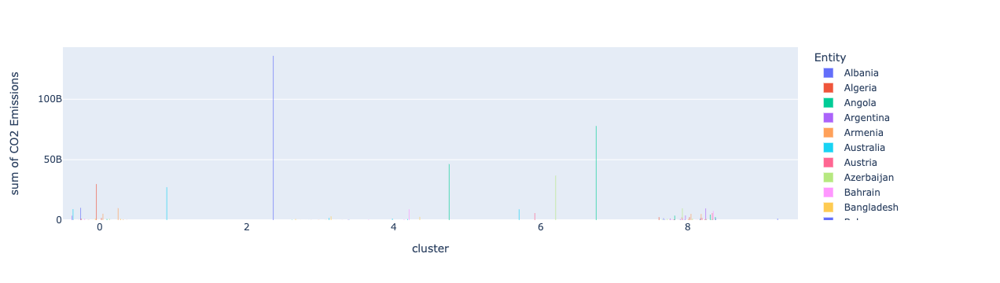

In [58]:
fig = px.histogram(snap, x='cluster', y=snap['CO2 Emissions'], color='Entity', barmode='group')
fig.show()

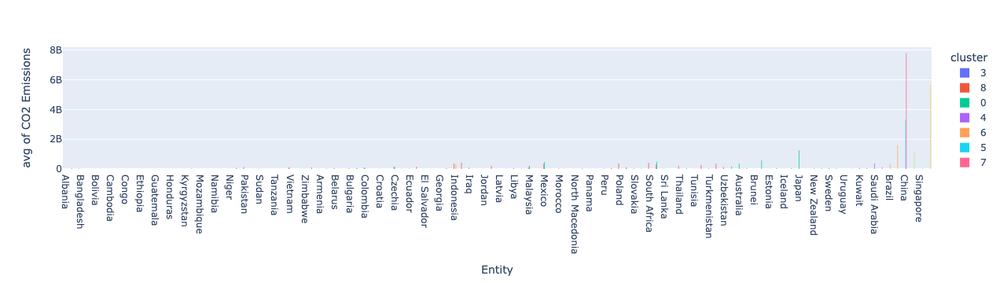

In [59]:
fig = px.histogram(snap, x='Entity', y='CO2 Emissions', color='cluster', barmode='group', histfunc='avg')
fig.show()

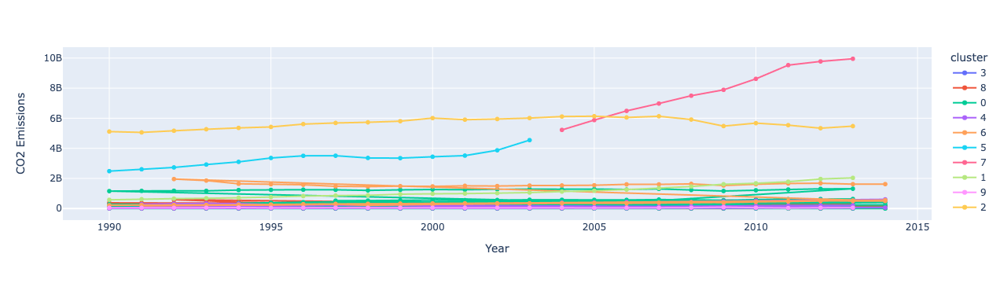

In [65]:
fig = px.line(snap, x='Year', y='CO2 Emissions', color='cluster', markers=True, hover_name='Entity')
fig.show()

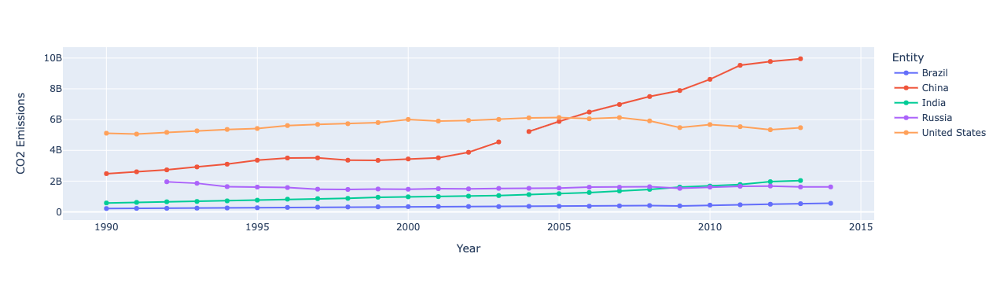

In [68]:
c = ['Brazil', 'India', 'China', 'Russia', 'United States']
fig = px.line(snap[snap['Entity'].isin(c)], x='Year', y='CO2 Emissions', color='Entity',line_group='cluster',markers=True, hover_name='Entity')
fig.show()

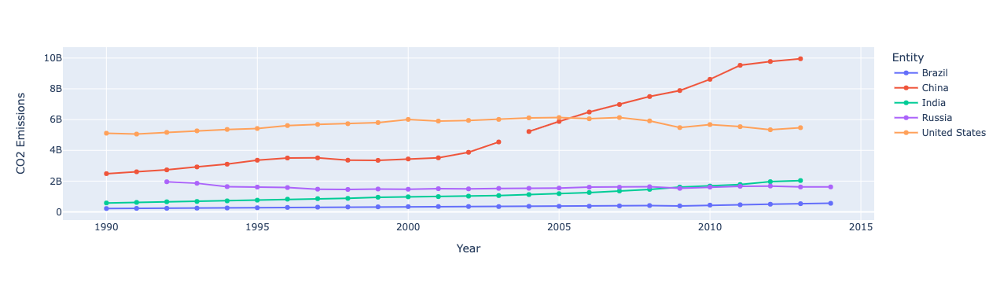

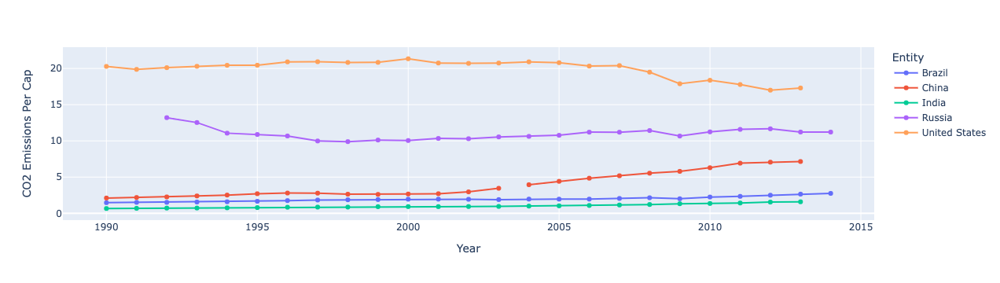

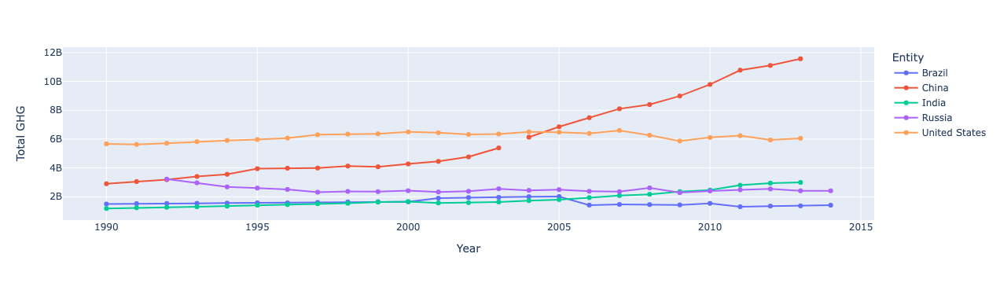

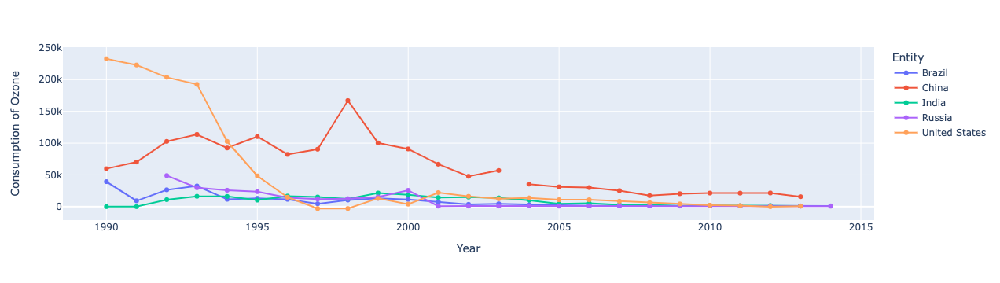

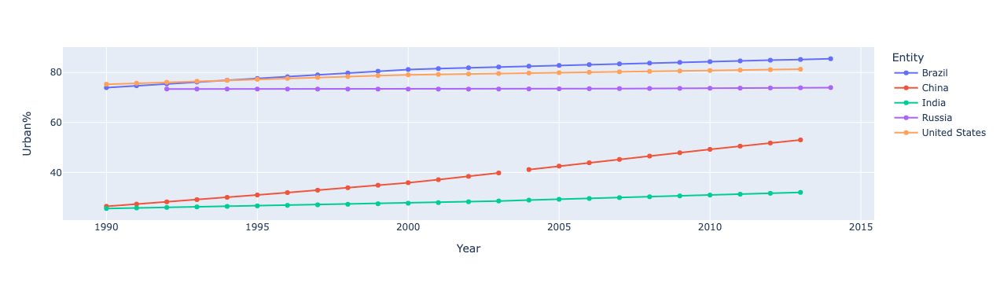

...

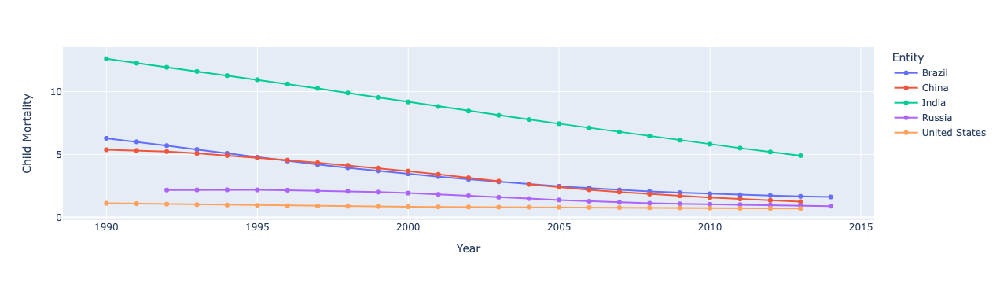

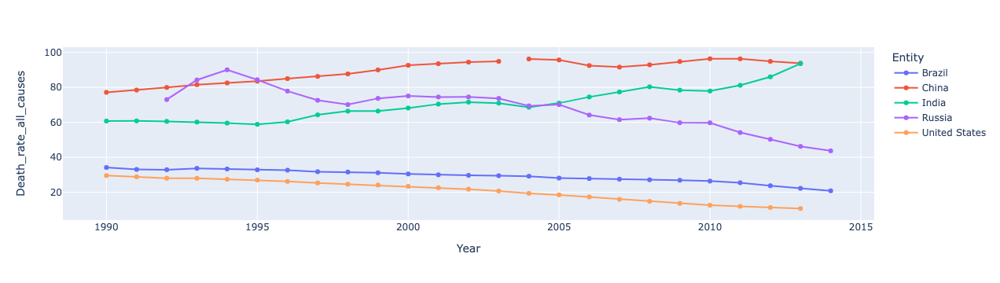

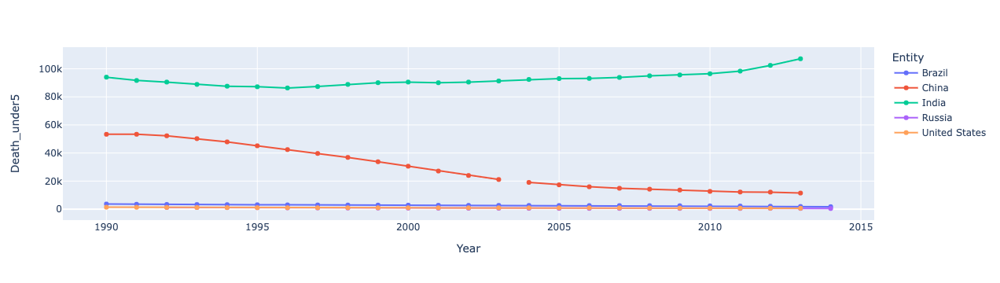

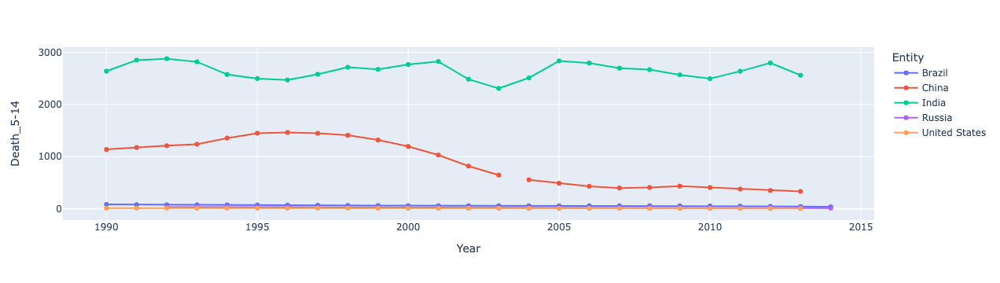

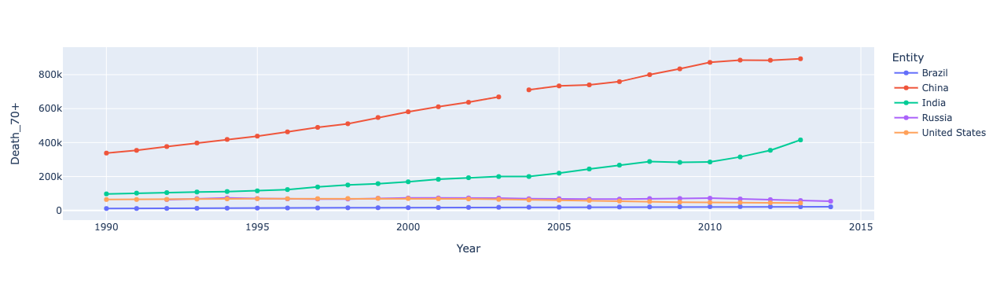

In [66]:
#plot each cluster's snap statistics (1by1) over time (line)

for stat in stats:
    fig = px.line(snap[snap['Entity'].isin(c)], x='Year', y=stat, color='Entity',line_group='cluster',markers=True)
    fig.show()

In [72]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns='Year').groupby('cluster').mean().T

cluster,0,1,2,3,4,5,6,7,8,9
CO2 Emissions,195241420.661,1126670762.917,5664404257.417,14819845.437,122462387.405,3306942444.071,777653427.379,7782466472.600,74610255.439,49664902.333
CO2 Emissions Per Cap,9.677,1.012,19.947,0.450,25.547,2.629,4.960,5.716,3.655,12.252
Total GHG,240651608.040,1818057500.000,6159869583.333,123525276.292,127859008.264,3935701428.571,2011754545.455,8920881000.000,121875561.268,50811250.000
Consumption of Ozone,2500.243,8908.782,47467.957,278.116,709.537,89397.579,7801.784,23945.755,861.627,706.672
Urban%,80.378,28.406,78.875,33.332,86.306,32.625,67.762,47.167,58.009,100.000
Population,145.757,363.856,31.124,115.047,270.189,129.384,43.710,140.848,101.897,6067.273
GDP,34391.225,2950.100,49302.893,2787.204,60407.689,2744.616,13149.499,7852.768,10351.416,59674.719
Forest area,33520151.314,67495141.667,305191875.000,21650299.506,254101.041,170210272.714,517324069.394,196814380.100,10927883.112,16706.379
Deaths %,4.170,17.749,3.912,14.659,15.130,23.310,8.222,19.959,10.786,6.427
Child Mortality,0.944,8.698,0.858,10.729,1.380,4.341,3.270,1.843,3.142,0.406


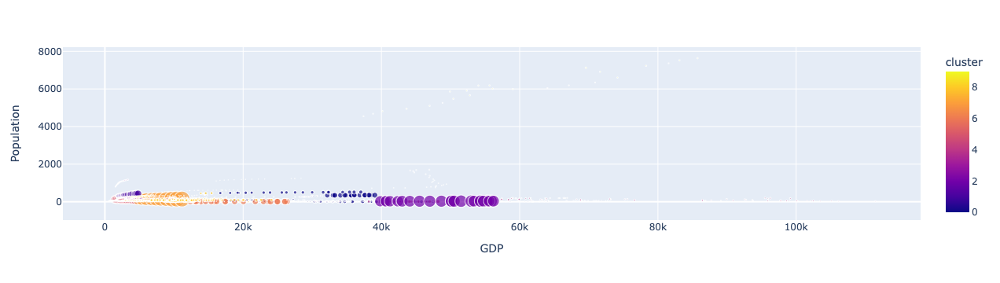

In [73]:
#scatter plots
fig = px.scatter(snap, x='GDP', y='Population', size='CO2 Emissions', color='cluster', hover_name='Entity')
fig.show()

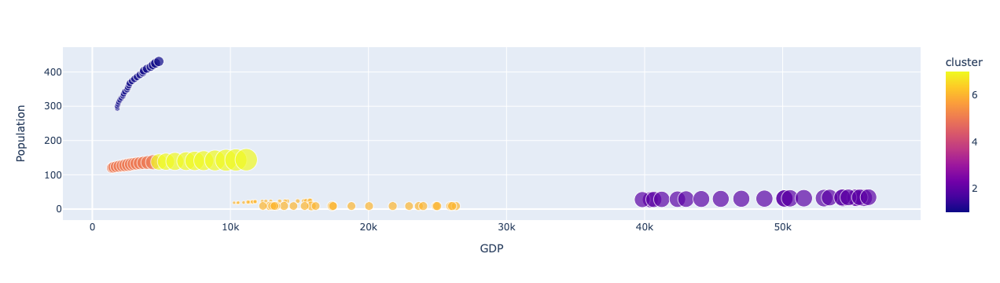

In [74]:
fig = px.scatter(snap[snap['Entity'].isin(c)], x='GDP', y='Population', size='CO2 Emissions', color='cluster', hover_name='Entity')
fig.show()

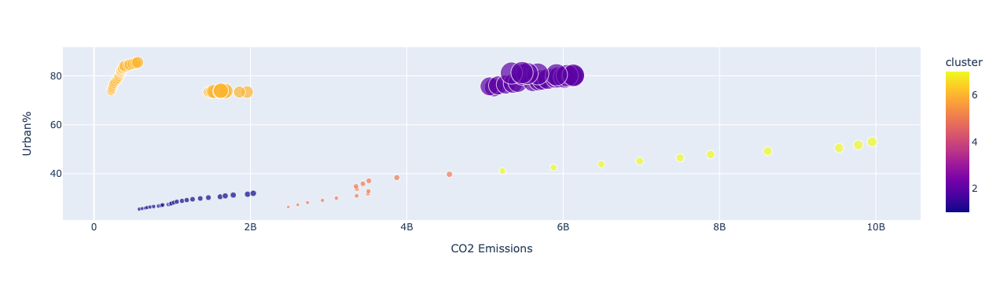

In [75]:
fig = px.scatter(snap[snap['Entity'].isin(c)], x='CO2 Emissions', y='Urban%', size='GDP', color='cluster', hover_name='Entity')
fig.show()

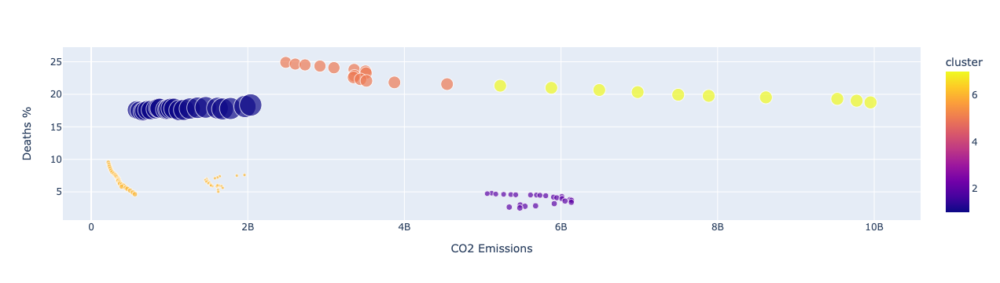

In [76]:
fig = px.scatter(snap[snap['Entity'].isin(c)], x='CO2 Emissions', y='Deaths %', size='Population', color='cluster', hover_name='Entity')
fig.show()